
 # <span style = 'color : Green' > Housing Prices Assignment - Advanced Regression
 
##### By : Gunabh Taneja

##### Date : 27th March 2024


 # <span style = 'color : Green' > # INTRODUCTION

## <span style = 'color : Green' > # Overview

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.


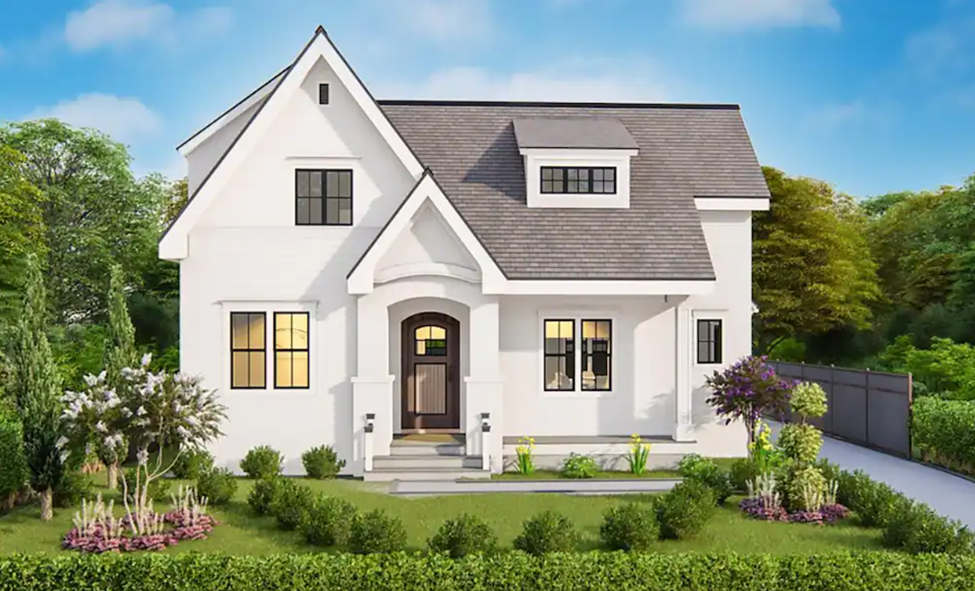

# <font color = green> Problem Statement:  <font>

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know the following things about the prospective properties:

- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression.

**<font color="blue">Input Data:</font>**
- **Surprise Housing Data Set:** Contains the sale of houses in Australia.
- **Surprise Housing Data dictionary:** Data dictionary which describes the meaning of all the variables present in Housing data set.



# <font color = green> Business Goal  <font>
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.


# <font color = green> Assignment flow  <font>

The solution is divided into the following sections: 
- Data understanding and exploration
- Data cleaning and Visualization
- Data preparation
- Model building and evaluation
- Residual analysis
- Conclusion


 # <font color=green>Step1: Data Understanding and Exploration</font>

Let's first have a look at the dataset and understand the size, attribute names etc.

## 1.1 Data Sourcing - Import all required Python libaries

In [1]:
#import all required Python libaries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Added to print data on current window screen
%matplotlib inline

#Added to avoid warning and not to display on notebook
import warnings
warnings.filterwarnings("ignore")

#Added reference for Linear, Ridge and Lasso model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn import linear_model, metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

pd.set_option('display.max_column',None)
pd.set_option('display.max_row',None)

## 1.2 Importing dataset to csv

In [2]:
#importing dataset to csv

hp=pd.read_csv("train.csv")
hp.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
hp.shape

(1460, 81)

## 1.3 Check Metadata using info() of DataFrame

In [4]:
#Check Metadata using info() of DataFrame
print("Metadata of DataFrame:\n")
hp.info()

Metadata of DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null

## 1.4 Describe the data of hp dataframe

In [5]:
#Describe the data of hp dataframe
hp.describe([0.25,0.50,0.75,0.90,0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
90%,1314.100000,120.000000,96.000000,14381.700000,8.000000,7.000000,2006.000000,2006.000000,335.000000,1065.500000,117.200000,1232.000000,1602.200000,1680.000000,954.200000,0.000000,2158.300000,1.000000,0.000000,2.000000,1.000000,4.000000,1.000000,9.000000,1.000000,2006.000000,3.000000,757.100000,262.000000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2010.000000,278000.000000
99%,1445.410000,190.000000,141.000000,37567.640000,10.000000,9.000000,2009.000000,2009.000000,791.920000,1572.410000,830.380000,1797.050000,2155.050000,2219.460000,1418.920000,360.000000,3123.480000,2.000000,1.000000,3.000000,1.000000,5.000000,2.000000,11.000000,2.000000,2009.000000,3.000000,1002.790000,505.460000,285.820000,261.050000,168.000000,268.050000,0.000000,700.000000,12.000000,2010.000000,442567.0100

 
 # <font color=green>Step2: Data cleaning and Visualization</font>
 - Null values
 - Drop unnecessary rows and column
 - Imputing unnecessary rows and column

## 2.1 checking percentage of null values in each column

In [6]:
#checking percentage of null values in each column

round(100*(hp.isnull().sum()/len(hp.index)), 2).sort_values(ascending=False).head(25) [hp.isnull().sum() > 0]

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageYrBlt      5.55
GarageCond       5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtQual         2.53
BsmtCond         2.53
BsmtFinType1     2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
dtype: float64

`Based on the above extract, we can say above 80% missing values is actually meangiful to keep in the model building, so lets drop is straight away`
- "PoolQC": Pool quality
- "MiscFeature": Miscellaneous feature not covered in other categories
- "Alley": Type of alley access to property
- "Fence": Fence quality
- "Id": index column

## 2.2 Drop unnecessary rows and column

In [7]:
hp = hp.drop(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'Id'],axis='columns')

In [8]:
hp.shape

(1460, 76)

In [9]:
#checking percentage of null values in each column

round(100*(hp.isnull().sum()/len(hp.index)), 2).sort_values(ascending=False).head(25) [hp.isnull().sum() > 0]

FireplaceQu     47.26
LotFrontage     17.74
GarageType       5.55
GarageYrBlt      5.55
GarageFinish     5.55
GarageQual       5.55
GarageCond       5.55
BsmtExposure     2.60
BsmtFinType2     2.60
BsmtQual         2.53
BsmtCond         2.53
BsmtFinType1     2.53
MasVnrType       0.55
MasVnrArea       0.55
Electrical       0.07
dtype: float64

`We could see ther are many missing values in some of the column which may contribute our analysis, so instead we replace with other values to segregate the items`

In [10]:
hp.FireplaceQu.fillna('No Fireplace',inplace=True)
hp.GarageCond.fillna('No Garage',inplace=True)
hp.GarageType.fillna('No Garage',inplace=True)
hp.GarageFinish.fillna('No Garage',inplace=True)
hp.GarageQual.fillna('No Garage',inplace=True)
hp.BsmtExposure.fillna('No Basement',inplace=True)
hp.BsmtFinType1.fillna('No Basement',inplace=True)
hp.BsmtFinType2.fillna('No Basement',inplace=True)
hp.BsmtQual.fillna('No Basement',inplace=True)
hp.BsmtCond.fillna('No Basement',inplace=True)

In [11]:
#checking percentage of null values in each column

round(100*(hp.isnull().sum()/len(hp.index)), 2).sort_values(ascending=False).head(25) [hp.isnull().sum() > 0]

LotFrontage    17.74
GarageYrBlt     5.55
MasVnrType      0.55
MasVnrArea      0.55
Electrical      0.07
dtype: float64

lets deep dive the analysis on these 5 variable and see what best we can fit

## 2.3 Analysis variable and see what best we can fit

`LotFrontage` : Linear feet of street connected to property.

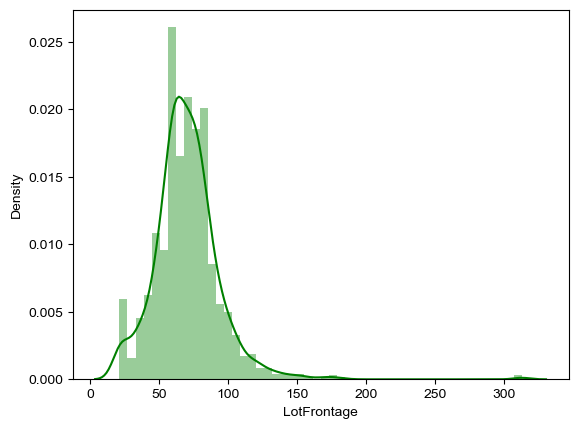

In [12]:
sns.distplot(hp['LotFrontage'], color="green", label="100% Equities")
sns.set(style='dark',)
sns.set_palette("tab10")
plt.show()

In [13]:
hp.LotFrontage.fillna(hp.LotFrontage.median(),inplace=True)

`GarageYrBlt`: Year garage was built

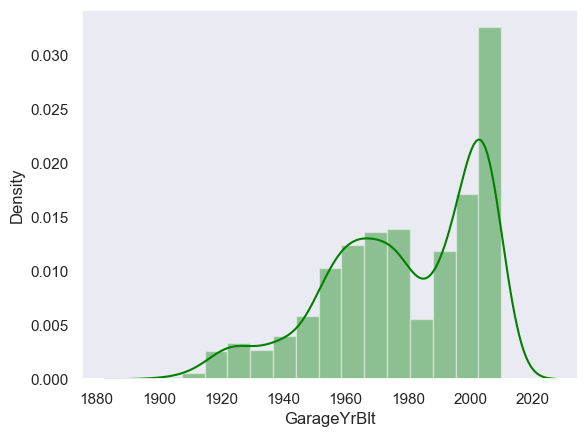

In [14]:
sns.distplot(hp['GarageYrBlt'], color="green", label="100% Equities")
sns.set(style='dark',)
sns.set_palette("tab10")
plt.show()

In [15]:
hp.GarageYrBlt.fillna(hp.GarageYrBlt.median(),inplace=True)

## 2.4 Checking the values count for these selected three missing variable

In [16]:
print(" \n\n----- Electrical: Electrical system          0.07% " )
print(hp['Electrical'].value_counts())

print(" \n\n----- MasVnrType: Masonry veneer type          0.55% " )
print(hp['MasVnrType'].value_counts())

print(" \n\n----- MasVnrArea: Masonry veneer area in square feet          0.55% " )
print(hp['MasVnrArea'].value_counts())

 

----- Electrical: Electrical system          0.07% 
SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64
 

----- MasVnrType: Masonry veneer type          0.55% 
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
 

----- MasVnrArea: Masonry veneer area in square feet          0.55% 
0.0       861
180.0       8
72.0        8
108.0       8
120.0       7
16.0        7
200.0       6
340.0       6
106.0       6
80.0        6
132.0       5
320.0       5
360.0       5
84.0        5
170.0       5
220.0       4
336.0       4
183.0       4
252.0       4
196.0       4
300.0       4
268.0       4
40.0        4
168.0       4
100.0       4
270.0       4
210.0       4
76.0        4
288.0       4
216.0       4
160.0       4
178.0       4
246.0       4
456.0       4
74.0        3
70.0        3
50.0        3
44.0        3
272.0       3
226.0       3
104.0       3
116.0       3
90.0        3
145.0       3
148.0   

Considering the small chunk of null values, we can replace with mode for Electrical & MasVnrType and mean for MasVnrArea

In [17]:
hp.MasVnrArea.fillna(hp.MasVnrArea.mean(),inplace=True)
hp.MasVnrType.fillna('None',inplace=True)
hp.Electrical.fillna('SBrkr',inplace=True)

In [18]:
#checking percentage of null values in each column

round(100*(hp.isnull().sum()/len(hp.index)), 2).sort_values(ascending=False).head(25) [hp.isnull().sum() > 0]

Series([], dtype: float64)

#### Perfect, we completed null values replacement as per the data , and now we are good to go with EDA part but before that lets do health check of dataframe.

## 2.5 Health check of dataframe before Data Preparation

In [19]:
hp.shape

(1460, 76)

**Below variable gives information about yeas o construction**

- YearBuilt: Original construction date
- YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)
- MoSold: Month Sold (MM)
- YrSold: Year Sold (YYYY)

Lets derive new column HouseOld of building and dropping the other columns.
Important point to know , we need to take "YearRemodAdd" date as house was re-model. 

### 2.5.1  Derive new columns

In [20]:
hp['HouseOld'] = hp['YrSold'] - hp['YearRemodAdd']
hp['HouseOld'].head()

0     5
1    31
2     6
3    36
4     8
Name: HouseOld, dtype: int64

In [21]:
hp.shape

(1460, 77)

### 2.5.2 Dropping some variablez as these are of no use anymore

In [22]:
# lets drop these 4 variable as these are of no use anymore
hp = hp.drop(['YrSold', 'MoSold','YearBuilt','YearRemodAdd'],axis='columns')

In [23]:
hp.shape

(1460, 73)

### 2.5.3 Take variables which are highly correlated, First normalize and then find those variable.

In [24]:
## Lets take variable which are highly correlated , that mean lets say 85% almosst same value. We will first normalize and then find those variable

non_normalize_cols = {}
for col in hp.columns:
    max_val = max(list(hp[col].value_counts(normalize=True).sort_values(ascending=False).head(1)))
    if max_val >= 0.85:
        non_normalize_cols[col] = round(max_val,2)
        
pd.DataFrame({'Features': list(non_normalize_cols.keys()), 'Percentage': list(non_normalize_cols.values())})

,Features,Percentage
0,Street,1.00
1,LandContour,0.90
2,Utilities,1.00
3,LandSlope,0.95
4,Condition1,0.86
5,Condition2,0.99
6,RoofMatl,0.98
7,ExterCond,0.88
8,BsmtCond,0.90
9,BsmtFinType2,0.86


#### These are highly correlated and henceforth straightway can be dropped from the analysis

In [25]:
# these are highly correlated and henceforth straightway can be dropped from the analysis
hp = hp.drop(non_normalize_cols.keys(), axis=1)

In [26]:
hp.shape

(1460, 46)

### 2.5.4 identify outliers -  Let's calculate using Inter-Quartile Range
#### We need to identify if we remove outliers then how mch percentage of data will be available. Let's calculate using Inter-Quartile Range 

In [27]:
#We need to identify if we remove outliers then how mch percentage of data will be available. Let's calculate using Inter-Quartile Range  

numFeatures = hp.select_dtypes(['int64','float64']).columns

hp_out = hp

#Calculate for numFeatures variables
for k in numFeatures:
    IQR = hp_out[k].quantile(.75) - hp_out[k].quantile(.25)
    hp_out = hp_out[(hp_out[k] < (hp_out[k].quantile(.75) + 1.5 * IQR)) & (hp_out[k] > (hp_out[k].quantile(.25) - 1.5 * IQR))]

hp_out.shape[0]/hp.shape[0] * 100

58.56164383561644

`This would not be wise option to remove outliers considering data left after remving outliers will be only 58.56% which will anyway impact the model buiilding`

### 2.4.5 plotting distribution of 'SalePrice'  without transformation and see behaviour

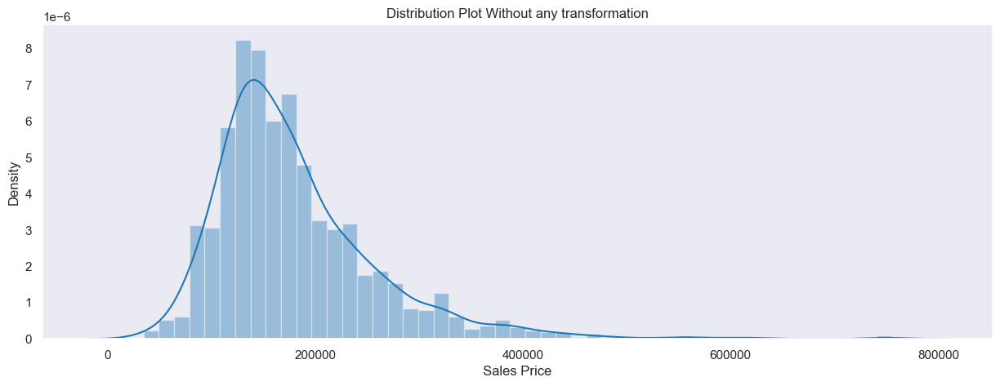

In [28]:
#plotting distribution of 'SalePrice'  without transformation and see behaviour

plt.figure(figsize=(15,5))
sns.distplot(hp.SalePrice)
plt.xlabel("Sales Price")
plt.title('Distribution Plot Without any transformation')
plt.show()

### 2.4.6 plotting distribution of 'SalePrice' tranform the dependent variable by taking LOG 

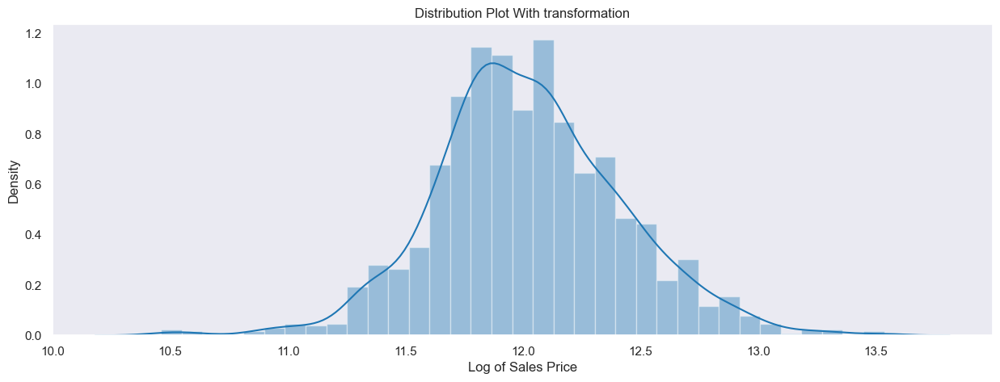

In [29]:
#plotting distribution of 'SalePrice' tranform the dependent variable by taking LOG 

plt.figure(figsize=(15,5))
sns.distplot(np.log(hp.SalePrice))
plt.xlabel("Log of Sales Price")
plt.title('Distribution Plot With transformation')
plt.show()

#### By applying log transformation on dependent column, we get normal distribution of data from originally right skewed distribution. Hence it is better to transformation on SalePrice column for pure model building.

In [30]:
hp['SalePrice'] = np.log(hp.SalePrice)

### 2.4.7 check the correlation coefficients using HeatMap.

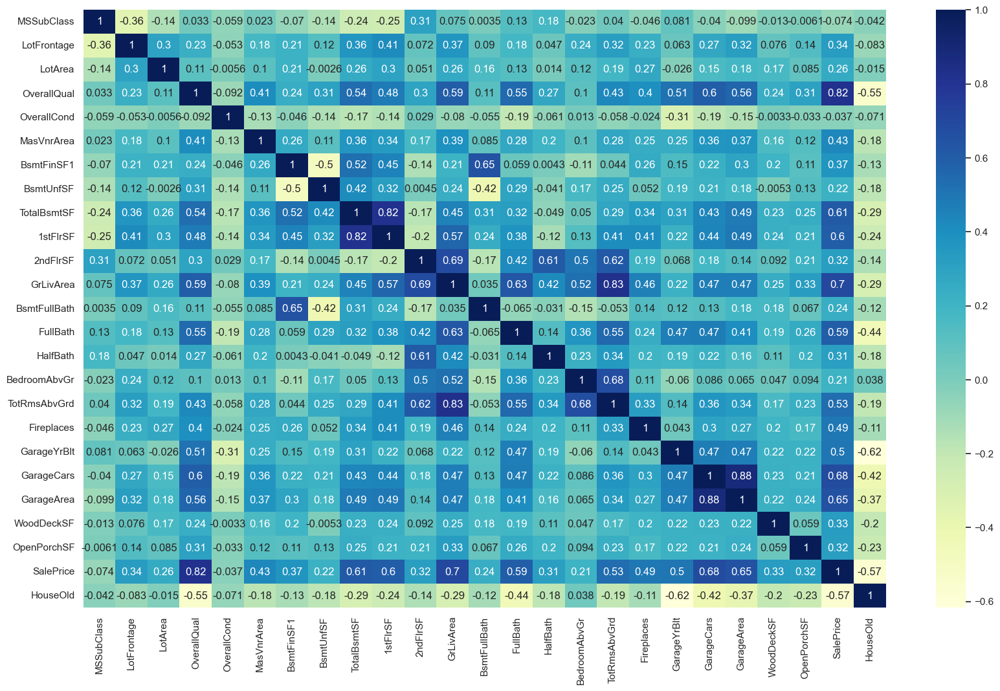

In [31]:
#Let's check the correlation coefficients using HeatMap. 
plt.figure(figsize = (20, 12))
sns.heatmap(hp.corr(), annot = True, cmap="YlGnBu")
plt.yticks(rotation=0)
plt.show()

Based on above heat-map below are the highly correlated features
- `TotalBsmtSF` and `1stFlrSF` have 82% correlation
- `TotRmsAbvGrd` and `GrLivArea` have 83% correlation
- `GarageCars` and `GarageArea` have 88% correlation
As both we cannot remove so let’s drop `1stFlrSF`, `TotRmsAbvGrd` and `GarageArea`.

In [32]:
hp.drop(['1stFlrSF', 'TotRmsAbvGrd', 'GarageArea'], axis=1, inplace=True)

In [33]:
# numFeatures columns
numFeatures = list(hp.select_dtypes(['int64', 'float64']))
numFeatures

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '2ndFlrSF',
 'GrLivArea',
 'BsmtFullBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'WoodDeckSF',
 'OpenPorchSF',
 'SalePrice',
 'HouseOld']

### 2.4.8 plot a graph using scatter plot for all numFeatures data with target variable 'SalePrice'

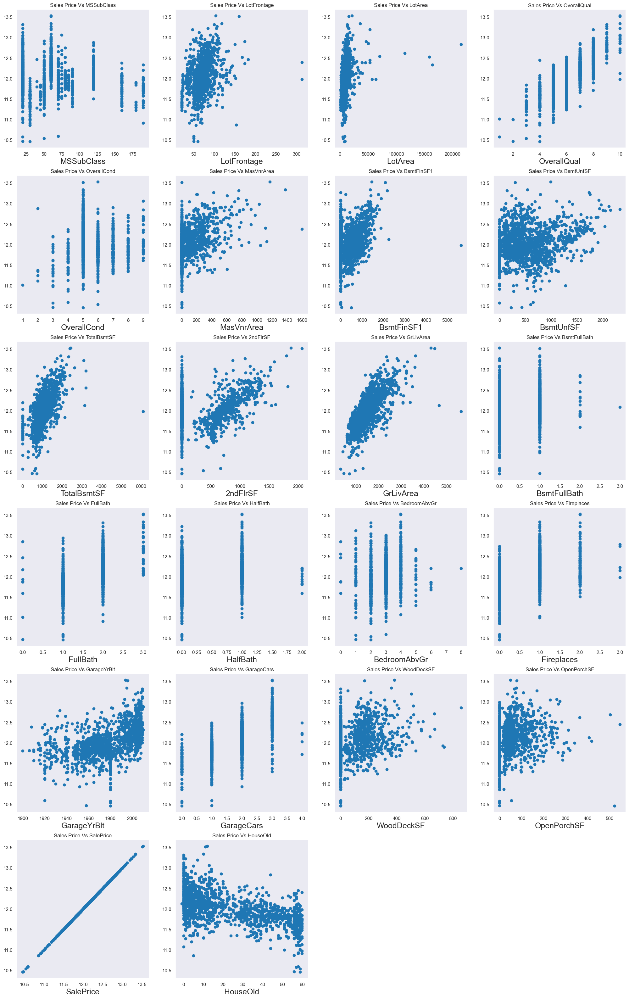

In [34]:
#let’s plot a graph using scatter plot for all numFeatures data with target variable 'SalePrice'

plt.figure(figsize=(25,40))
for i, j in enumerate(numFeatures):
    plt.subplot(6,4,i+1)
    plt.scatter(hp[j], hp['SalePrice'])
    plt.xlabel(j,fontsize=18)
    plt.title("Sales Price Vs " + j)
plt.show()

In [35]:
#catFeatures columns
catFeatures = list(hp.select_dtypes('object'))
catFeatures

['MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'SaleCondition']

### 2.4.9 Avoid repetation code so creating function for displaying box plot

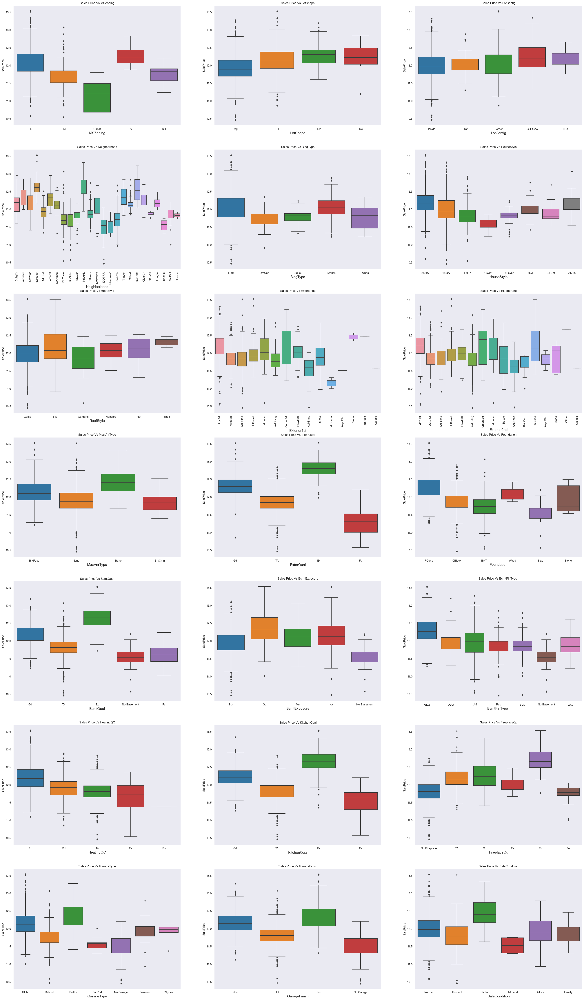

In [36]:
#Avoid repetation code so creating function for displaying box plot
plt.figure(figsize=(40,100))
for m, n in enumerate(catFeatures):
    plt.subplot(10, 3, (m+1))
    sns.boxplot(x=n, y='SalePrice',data=hp)
    plt.xlabel(n, fontsize=14)
    plt.title("Sales Price Vs " + n)
    if n == "Neighborhood" or n == "Exterior1st" or n == "Exterior2nd":
        plt.xticks(rotation=90)
plt.show()


# <font color=green>Step 3: Data preparation -EDA</font>

- In order to fit a regression line, we would need numerical values and not string. Hence, we need to convert them to 1s and 0s. So let's do it for all columns which is having string values by using `Dummy Variable` concept.
- But before that, it is always better option to convert ordered categorical variable into numeric type rather than converting them into dummies as they add value to our model.

In [37]:
hp.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LotConfig', 'Neighborhood', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenQual', 'Fireplaces', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'WoodDeckSF',
       'OpenPorchSF', 'SaleCondition', 'SalePrice', 'HouseOld'],
      dtype='object')

In [38]:
print("****************LotShape**************")
print(hp.LotShape.value_counts())
print("\n\n****************ExterQual**************")
print(hp.ExterQual.value_counts())
print("\n\n****************BsmtQual**************")
print(hp.BsmtQual.value_counts())
print("\n\n****************BsmtExposure**************")
print(hp.BsmtExposure.value_counts())
print("\n\n****************BsmtFinType1**************")
print(hp.BsmtFinType1.value_counts())
print("\n\n****************HeatingQC**************")
print(hp.HeatingQC.value_counts())
print("\n\n****************KitchenQual**************")
print(hp.KitchenQual.value_counts())
print("\n\n****************FireplaceQu**************")
print(hp.FireplaceQu.value_counts())
print("\n\n****************GarageFinish**************")
print(hp.GarageFinish.value_counts())

****************LotShape**************
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64


****************ExterQual**************
TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64


****************BsmtQual**************
TA             649
Gd             618
Ex             121
No Basement     37
Fa              35
Name: BsmtQual, dtype: int64


****************BsmtExposure**************
No             953
Av             221
Gd             134
Mn             114
No Basement     38
Name: BsmtExposure, dtype: int64


****************BsmtFinType1**************
Unf            430
GLQ            418
ALQ            220
BLQ            148
Rec            133
LwQ             74
No Basement     37
Name: BsmtFinType1, dtype: int64


****************HeatingQC**************
Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64


****************KitchenQual**************
TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dt

## 3.1 Ordered categorical variables which need to be converted to numerical values.

**Below are the ordered categorical variables which need to be converted to numerical values:**
- `LotShape`: General shape of property
- `ExterQual`: Evaluates the quality of the material on the exterior 
- `BsmtQual`: Evaluates the height of the basement
- `BsmtExposure`: Refers to walkout or garden level walls
- `BsmtFinType1`: Rating of basement finished area
- `HeatingQC`: Heating quality and condition
- `KitchenQual`: Kitchen quality
- `FireplaceQu`: Fireplace quality
- `GarageFinish`: Interior finish of the garage

In [39]:
#mapping is based on the data dictionaty for LotShape
hp['LotShape'] = hp['LotShape'].map({'Reg':3,'IR1':2,'IR2':1,'IR3':0})

#mapping is based on the data dictionaty for ExterQual
hp['ExterQual'] = hp['ExterQual'].map({'Ex':4,'Gd':3,'TA':2,'Fa':1,'Po':0})

#mapping is based on the data dictionaty for BsmtQual
hp['BsmtQual'] = hp['BsmtQual'].map({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1,'No Basement':0})

##mapping is based on  on the data dictionaty for BsmtExposure
hp['BsmtExposure'] = hp['BsmtExposure'].map({'Gd':4,'Av':3,'Mn':2,'No':1,'No Basement':0})

##mapping is based on  on the data dictionaty for BsmtFinType1
hp['BsmtFinType1'] = hp['BsmtFinType1'].map({'GLQ':6,'ALQ':5,'BLQ':4,'Rec':3,'LwQ':2,'Unf':1,'No Basement':0})

##mapping is based on  on the data dictionaty
hp['HeatingQC'] = hp['HeatingQC'].map({'Ex':4,'Gd':3,'TA':2,'Fa':1,'Po':0})

##mapping is based on  on the data dictionaty for KitchenQual
hp['KitchenQual'] = hp['KitchenQual'].map({'Ex':4,'Gd':3,'TA':2,'Fa':1,'Po':0})

##mapping is based on  on the data dictionaty for FireplaceQu
hp['FireplaceQu'] = hp['FireplaceQu'].map({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1,'No Fireplace':0})

##mapping is based on  on the data dictionaty for GarageFinish
hp['GarageFinish'] = hp['GarageFinish'].map({'Fin':3,'RFn':2,'Unf':1,'No Garage':0})

In [40]:
hp.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SaleCondition,SalePrice,HouseOld
0,60,RL,65.0,8450,3,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,3,PConc,4,1,6,706,150,856,4,854,1710,1,2,1,3,3,0,0,Attchd,2003.0,2,2,0,61,Normal,12.247694,5
1,20,RL,80.0,9600,3,FR2,Veenker,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,2,CBlock,4,4,5,978,284,1262,4,0,1262,0,2,0,3,2,1,3,Attchd,1976.0,2,2,298,0,Normal,12.109011,31
2,60,RL,68.0,11250,2,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,3,PConc,4,2,6,486,434,920,4,866,1786,1,2,1,3,3,1,3,Attchd,2001.0,2,2,0,42,Normal,12.317167,6
3,70,RL,60.0,9550,2,Corner,Crawfor,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,2,BrkTil,3,1,5,216,540,756,3,756,1717,1,1,0,3,3,1,4,Detchd,1998.0,1,3,0,35,Abnorml,11.849398,36
4,60,RL,84.0,14260,2,FR2,NoRidge,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,3,PConc,4,3,6,655,490,1145,4,1053,2198,1,2,1,4,3,1,3,Attchd,2000.0,2,3,192,84,Normal,12.429216,8


### Describe the data of hp dataframe

In [41]:
#Describe the data of hp dataframe
hp.describe([0.25,0.50,0.75,0.90,0.99])

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,2.591781,6.099315,5.575342,103.685262,2.39589,3.489041,1.630137,3.545890,443.639726,567.240411,1057.429452,3.145205,346.992466,1515.463699,0.425342,1.565068,0.382877,2.866438,2.511644,0.613014,1.825342,1978.589041,1.715753,1.767123,94.244521,46.660274,12.024051,22.950000
std,42.300571,22.027677,9981.264932,0.582296,1.382997,1.112799,180.569112,0.57428,0.876478,1.067391,2.107776,456.098091,441.866955,438.705324,0.959501,436.528436,525.480383,0.518911,0.550916,0.502885,0.815778,0.663760,0.644666,1.810877,23.997022,0.892831,0.747315,125.338794,66.256028,0.399452,20.640653
min,20.000000,21.000000,1300.000000,0.000000,1.000000,1.000000,0.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,10.460242,-1.000000
25%,20.000000,60.000000,7553.500000,2.000000,5.000000,5.000000,0.000000,2.00000,3.000000,1.000000,1.000000,0.000000,223.000000,795.750000,2.000000,0.000000,1129.500000,0.000000,1.000000,0.000000,2.000000,2.000000,0.000000,0.000000,1962.000000,1.000000,1.000000,0.000000,0.000000,11.775097,4.000000
50%,50.000000,69.000000,9478.500000,3.000000,6.000000,5.000000,0.000000,2.00000,4.000000,1.000000,4.000000,383.500000,477.500000,991.500000,4.000000,0.000000,1464.000000,0.000000,2.000000,0.000000,3.000000,2.000000,1.000000,2.000000,1980.000000,2.000000,2.000000,0.000000,25.000000,12.001505,14.000000
75%,70.000000,79.000000,11601.500000,3.000000,7.000000,6.000000,164.250000,3.00000,4.000000,2.000000,6.000000,712.250000,808.000000,1298.250000,4.000000,728.000000,1776.750000,1.000000,2.000000,1.000000,3.000000,3.000000,1.000000,4.000000,2001.000000,2.000000,2.000000,168.000000,68.000000,12.273731,41.000000
90%,120.000000,92.000000,14381.700000,3.000000,8.000000,7.000000,335.000000,3.00000,4.000000,3.000000,6.000000,1065.500000,1232.000000,1602.200000,4.000000,954.200000,2158.300000,1.000000,2.000000,1.000000,4.000000,3.000000,1.000000,4.000000,2006.000000,3.000000,3.000000,262.000000,130.000000,12.535376,56.000000
99%,190.000000,137.410000,37567.640000,3.000000,10.000000,9.000000,791.280000,4.00000,5.000000,4.000000,6.000000,1572.410000,1797.050000,2155.050000,4.000000,1418.920000,3123.480000,2.000000,3.000000,1.000000,5.000000,4.000000,2.000000,5.000000,2009.000000,3.000000,3.000000,505.460000,285.820000,13.000323,60.000000
max,190.000000,313.000000,215245.000000,3.000000,10.000000,9.000000,1600.000000,4.00000,5.000000,4.000000,6.000000,5644.000000,2336.000000,6110.000000,4.000000,2065.000000,5642.000000,3.000000,3.000000,2.000000,8.000000,4.000000,3.000000,5.000000,2010.000000,3.000000,4.000000,857.000000,547.000000,13.534473,60.000000


In [42]:
catFeatures = hp.select_dtypes('object').columns
catFeatures

Index(['MSZoning', 'LotConfig', 'Neighborhood', 'BldgType', 'HouseStyle',
       'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
       'GarageType', 'SaleCondition'],
      dtype='object')

## 3.2 Get dummies for unordered categorical columns.

In [43]:
#get dummies for unordered categorical columns.

for j in catFeatures:
    dummy_df = pd.get_dummies(hp[j], prefix=j, drop_first=True)   
    hp = pd.concat([hp, dummy_df], axis=1)
    hp.drop(j, axis=1, inplace=True)   #Dropping main column name as it is not required after dummy variable creation.

In [44]:
hp.head()

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.0,8450,3,7,5,196.0,3,4,1,6,706,150,856,4,854,1710,1,2,1,3,3,0,0,2003.0,2,2,0,61,12.247694,5,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,20,80.0,9600,3,6,8,0.0,2,4,4,5,978,284,1262,4,0,1262,0,2,0,3,2,1,3,1976.0,2,2,298,0,12.109011,31,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,60,68.0,11250,2,7,5,162.0,3,4,2,6,486,434,920,4,866,1786,1,2,1,3,3,1,3,2001.0,2,2,0,42,12.317167,6,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,70,60.0,9550,2,7,5,0.0,2,3,1,5,216,540,756,3,756,1717,1,1,0,3,3,1,4,1998.0,1,3,0,35,11.849398,36,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,60,84.0,14260,2,8,5,350.0,3,4,3,6,655,490,1145,4,1053,2198,1,2,1,4,3,1,3,2000.0,2,3,192,84,12.429216,8,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [45]:
hp.shape

(1460, 127)

In [46]:
#Describe the data of hp dataframe
hp.describe([0.25,0.50,0.75,0.90,0.99])

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,2.591781,6.099315,5.575342,103.685262,2.39589,3.489041,1.630137,3.545890,443.639726,567.240411,1057.429452,3.145205,346.992466,1515.463699,0.425342,1.565068,0.382877,2.866438,2.511644,0.613014,1.825342,1978.589041,1.715753,1.767123,94.244521,46.660274,12.024051,22.950000,0.044521,0.010959,0.78

## 3.3 Splitting the Data into Training and Testing Sets

In [47]:
#train-test split.
np.random.seed(0)
hp_train, hp_test = train_test_split(hp, train_size = 0.7, random_state = 100)

In [48]:
hp_train.shape

(1021, 127)

In [49]:
hp_train.describe([0.25,0.50,0.75,0.90,0.99])

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000
mean,58.472086,69.569050,10489.964740,2.585700,6.093046,5.580803,104.895927,2.399608,3.479922,1.662096,3.593536,448.165524,563.745348,1061.998041,3.150833,343.540646,1518.150833,0.439765,1.567091,0.377081,2.856024,2.511263,0.598433,1.798237,1978.855044,1.712047,1.771792,92.641528,47.035260,12.023180,22.834476,0.044074,0.012733,0.785

In [50]:
hp_test.shape

(439, 127)

## 3.4 Rescaling the features by Creating MinMaxScaler instance

In [51]:
# Rescaling the features by Creating MinMaxScaler instance
scaler = MinMaxScaler()

## 3.5 Fit and Transform the Train Data & Transform the Test Data Set

In [52]:
# Apply scaler() to all the columns except the '0 or 1' and 'dummy' variables
num_vars = hp_train.select_dtypes(include=['int64','float64']).columns

#Fit and Transform Train Data
hp_train[num_vars] = scaler.fit_transform(hp_train[num_vars])

#Transform Test Data
hp_test[num_vars] = scaler.transform(hp_test[num_vars])

In [53]:
hp_train.head()

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
318,0.235294,0.236301,0.039403,1.0,0.666667,0.500,0.16,0.666667,0.8,1.00,1.000000,0.174876,0.154110,0.220458,1.00,0.616949,0.424289,0.333333,0.666667,0.5,0.500,0.666667,0.333333,0.6,0.845455,0.666667,0.75,0.396733,0.114723,0.653235,0.278689,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
239,0.176471,0.106164,0.033981,1.0,0.555556,0.375,0.00,0.333333,0.6,0.25,0.333333,0.016655,0.274401,0.120295,0.50,0.333656,0.201576,0.000000,0.333333,0.5,0.375,0.333333,0.333333,0.8,0.445455,0.333333,0.25,0.000000,0.267686,0.382177,1.000000,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
986,0.176471,0.130137,0.017931,1.0,0.555556,0.875,0.00,0.333333,0.6,0.25,0.166667,0.000000,0.207620,0.079378,0.75,0.307022,0.230015,0.000000,0.333333,0.0,0.250,0.666667,0.000000,0.0,0.454545,0.333333,0.25,0.459743,0.000000,0.393493,0.065574,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1416,1.000000,0.133562,0.046139,1.0,0.333333,0.625,0.00,0.333333,0.6,0.25,0.166667,0.000000,0.332620,0.127169,0.75,0.505569,0.355880,0.000000,0.666667,0.0,0.500,0.333333,0.000000,0.0,0.645455,0.333333,0.50,0.000000,0.000000,0.408435,1.000000,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0
390,0.176471,0.099315,0.032409,1.0,0.444444,0.875,0.00,0.333333,0.6,0.25,0.500000,0.042700,0.098031,0.140917,1.00,0.196610,0.1

In [54]:
hp_train.describe([0.25,0.50,0.75,0.90,0.99])

,MSSubClass,LotFrontage,LotArea,LotShape,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,HouseOld,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000
mean,0.226306,0.166332,0.042162,0.861900,0.565894,0.572600,0.065560,0.466536,0.695984,0.415524,0.598923,0.079406,0.241329,0.173813,0.787708,0.166364,0.207562,0.146588,0.522364,0.188541,0.357003,0.503754,0.199478,0.359647,0.716864,0.570682,0.442948,0.108100,0.089934,0.508400,0.390729,0.044074,0.012733,0.785504,0.150833,0.064643,0.030

## 3.6 Heatmap Analysis of Train Data Set  to find out which variable is performing well

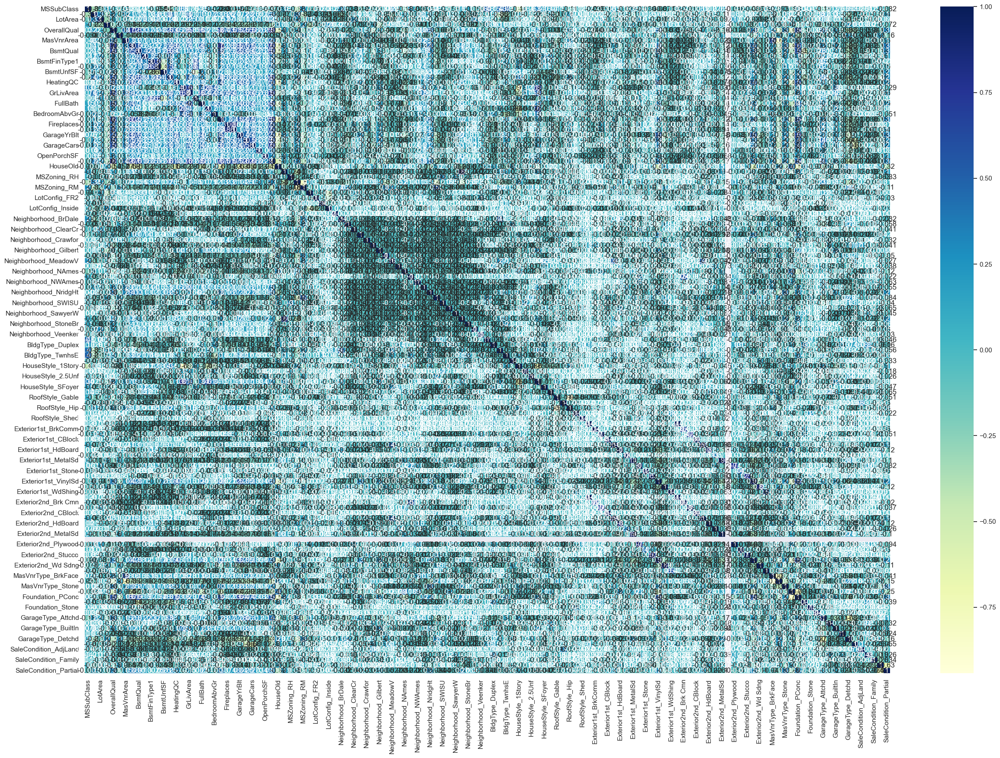

In [55]:
plt.figure(figsize = (30, 20))
sns.heatmap(hp_train.corr(), annot = True, cmap="YlGnBu")
plt.show()

Due to unreadable, this is difficult to find out which variable is performing well, henceforth we will choose RFE to get best 50 features out of 127.
Also we know target variable is `SalePrice` henceforth we will conider this as `X_train`

## 3.7 Divide Train and Test Data into X and Y sets

In [56]:
#Get X and y for Train data
y_train = hp_train.pop('SalePrice')
X_train = hp_train

#Get X and y for Test Data
y_test = hp_test.pop('SalePrice')
X_test = hp_test

In [57]:
print("X_train shape: ", X_train.shape)
print("X_test shape: ", X_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (1021, 126)
X_test shape:  (439, 126)
y_train shape:  (1021,)
y_test shape:  (439,)



# <font color=green>Step 4: Model Building and Evaluation</font>

Recursive Feature Elimination (RFE) we will choose best 50 variable in RFE model

# <font color=green>Linear Regression</font>


## 4.1 Creating an object of linear Regression

In [58]:
#Creating an object of linear Regression
hp_lm = LinearRegression()

# 4.2 Fitting a model in Linear Regression using RFE

In [59]:
#Fitting a model
hp_lm.fit(X_train,y_train)

#So we will be eliminating columns using RFE in a set of 50 features. 

hp_rfe = RFE(hp_lm, step = 50)

hp_rfe = hp_rfe.fit(X_train,y_train)

`Below are the variable selected by RFE`

### 4.2.1 Display columns selected by RFE and their weights.

In [60]:
#Display columns selected by RFE and their weights.
rfe_temp = pd.DataFrame(list(zip(X_train.columns, hp_rfe.support_,hp_rfe.ranking_)), columns=['Feature', 'RFE_Support', 'RFE_Ranking']).sort_values(by='RFE_Ranking')
rfe_temp = rfe_temp.loc[rfe_temp['RFE_Ranking'] == 1]
rfe_temp.reset_index(drop=True, inplace=True)
rfe_temp

,Feature,RFE_Support,RFE_Ranking
0,MSSubClass,True,1
1,Exterior1st_BrkComm,True,1
2,Exterior1st_AsphShn,True,1
3,RoofStyle_Gambrel,True,1
4,HouseStyle_2.5Unf,True,1
5,HouseStyle_2.5Fin,True,1
6,BldgType_Twnhs,True,1
7,SaleCondition_Normal,True,1
8,Neighborhood_Veenker,True,1
9,Neighborhood_StoneBr,True,1


In [61]:
rfeFeatures = X_train.columns[hp_rfe.support_]
rfeFeatures

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'HeatingQC', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'BedroomAbvGr',
       'KitchenQual', 'FireplaceQu', 'GarageCars', 'WoodDeckSF', 'HouseOld',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'LotConfig_FR3', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_MeadowV',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst',
       'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'BldgType_Twnhs',
       'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'RoofStyle_Gambrel',
       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace',
       'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc',
       'Exterior1st_Stucco', 'Exterior1st_WdShing', 'Exterior2nd_AsphShn',
       'Exterior2nd_CBlo

In [62]:
X_train_new = X_train[rfeFeatures]
X_test_new = X_test[rfeFeatures]
print("X_train_new shape with 50 features: ", X_train_new.shape)
print("X_test_new shape with 50 features: ", X_test_new.shape)
print("y_train shape with 50 features: ", y_train.shape)
print("y_test shape with 50 features: ", y_test.shape)

X_train_new shape with 50 features:  (1021, 63)
X_test_new shape with 50 features:  (439, 63)
y_train shape with 50 features:  (1021,)
y_test shape with 50 features:  (439,)


## 4.3 Fit new Train Data Set and find R2 score for them.

In [63]:
#Let's fit new Train Data Set and find R2 score for them.

hp_lm.fit(X_train_new, y_train)

LinearRegression()

### 4.3.1 Display coefficient and intercept

In [64]:
#Let's display coefficient and intercept.
print(hp_lm.intercept_)
print(hp_lm.coef_)

-0.03468525580640969
[-4.32910579e-02 -9.20905069e-02  1.16018312e-01  1.77330691e-01
  7.23590228e-02 -1.22715878e-02  5.31794490e-02  2.99317270e-02
  2.67669045e-02 -4.34567164e-02  1.36336619e-02  3.53166185e-01
  5.60538105e-02  3.69257558e-02  4.48650835e-02  2.32859426e-02
  2.56842672e-02  8.21798381e-02  2.86126437e-02 -3.00341088e-02
  1.21130466e-01  1.21178820e-01  1.28318042e-01  1.00724501e-01
 -2.06526275e-02  2.21837622e-02  3.04917929e-02  5.10802154e-02
 -2.02225100e-02 -3.05013280e-02  3.84021089e-02  4.97212836e-02
  3.93536838e-02  4.15167939e-02  3.34915936e-02 -2.18057772e-02
 -2.87399203e-02  1.54969941e-02 -2.32693354e-02  1.56129568e+12
 -7.77745349e-02  3.69454176e-02 -1.29287578e+12 -4.03506972e-02
 -2.08058572e-02 -2.10778801e-02  9.32633099e-03 -1.56129568e+12
  1.29287578e+12  4.45322807e-02 -6.77877516e+05 -3.22842284e-02
  9.21442790e-03  2.70335827e-02  2.94472600e-02  5.21172789e-02
  3.07134067e-02  4.99119881e-02  1.19602207e-02  4.07525990e-02
  1.

## 4.4 Creating a function which will print R2 Score, RSS, MSE and RMSE for both Train and Test Data Set

In [65]:
#Creating a function which will print R2 Score, RSS, MSE and RMSE for both Train and Test Data Set
def calculate_metric(y_train, y_train_pred, y_test, y_test_pred):
    
    metric = []

    r2_train_lr = r2_score(y_train, y_train_pred)
    print('Train R2 score: ', r2_train_lr)
    metric.append(r2_train_lr)

    r2_test_lr = r2_score(y_test, y_test_pred)
    print('Test R2 score: ', r2_test_lr)
    metric.append(r2_test_lr)

    rss1_lr = np.sum(np.square(y_train - y_train_pred))
    print('Train RSS score: ', rss1_lr)
    metric.append(rss1_lr)

    rss2_lr = np.sum(np.square(y_test - y_test_pred))
    print('Test RSS score: ', rss2_lr)
    metric.append(rss2_lr)

    mse_train_lr = mean_squared_error(y_train, y_train_pred)
    print('Train MSE score: ', mse_train_lr)
    metric.append(mse_train_lr)

    mse_test_lr = mean_squared_error(y_test, y_test_pred)
    print('Test MSE score: ', mse_test_lr)
    metric.append(mse_test_lr)

    rmse_train_lr = mse_train_lr**0.5
    print('Train RMSE score: ', rmse_train_lr)
    metric.append(rmse_train_lr)

    rmse_test_lr = mse_test_lr**0.5
    print('Test RMSE score: ', rmse_test_lr)
    metric.append(rmse_test_lr)
    
    return metric

## 4.5 Predict and analysis the R2 Score, RSS, MSE and RMSE for both Train and Test Data Set

In [66]:
y_train_pred = hp_lm.predict(X_train_new)
y_test_pred = hp_lm.predict(X_test_new)

print("****************Data without Regularization********************")
metric1 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data without Regularization********************
Train R2 score:  0.9043472549673167
Test R2 score:  -6.36814029886049e+23
Train RSS score:  1.6238616333383362
Test RSS score:  4.875288431037319e+24
Train MSE score:  0.001590461932750574
Test MSE score:  1.1105440617397083e+22
Train RMSE score:  0.039880595942771144
Test RMSE score:  105382354392.92995
***************************************************************



# <font color=green>Ridge Regression:</font>

## 4.6 Regularization using Ridge Regression

In [67]:
parm = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
ridge_model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = parm, 
                        scoring= 'r2',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

## 4.7 Printing the best hyperparameter alpha using Ridge Regression

In [68]:
# Printing the best hyperparameter alpha
print("Ridge Best param: ", ridge_model_cv.best_params_)
print("Ridge Best Score: ", ridge_model_cv.best_score_)
print("Ridge Best estimator: ", ridge_model_cv.best_estimator_)
ridge_cv_results = pd.DataFrame(ridge_model_cv.cv_results_)
ridge_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']]

Ridge Best param:  {'alpha': 1.0}
Ridge Best Score:  0.8781194804387834
Ridge Best estimator:  Ridge()


,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,0.908206,0.871497,18
1,0.001,0.908206,0.871517,17
2,0.01,0.908205,0.871706,16
3,0.05,0.908179,0.872475,15
4,0.1,0.908104,0.873295,13
5,0.2,0.907854,0.874584,11
6,0.3,0.907512,0.875538,10
7,0.4,0.907111,0.876259,9
8,0.5,0.906675,0.876811,7
9,0.6,0.906216,0.877234,6


## 4.8 Plotting mean test and train set with alpha VS R2 scores using Ridge Regression

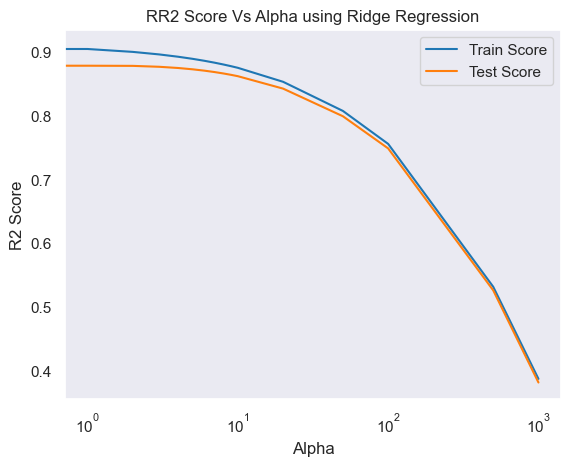

In [69]:
# plotting mean test and train scores with alpha 

# Converting the 'param_alpha' datatype from object to int
ridge_cv_results['param_alpha'] = ridge_cv_results['param_alpha'].astype('int32')

# Plotting R2 Score of Train score
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_train_score'])

# Plotting R2 Score of Test score
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_test_score'])

plt.xlabel('Alpha')
plt.ylabel('R2 Score')
plt.title("RR2 Score Vs Alpha using Ridge Regression")
plt.legend(['Train Score', 'Test Score'], loc='upper right')
plt.xscale('log')
plt.show()

## 4.9 Fitting Ridge model for alpha = 2 and printing coefficients which have been penalised

**<font color="maroon">Based on above data for Ridge Regression best Alpha Value is `"1"` for processing.</font>**

In [70]:
#Fitting Ridge model for alpha = 2 and printing coefficients which have been penalised
alpha = 1
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[-0.0362991  -0.04582349  0.07708217  0.17217212  0.07424008 -0.00135957
  0.05585956  0.02855143  0.01998141  0.00322428  0.02225131  0.26942837
  0.05019174  0.04661345  0.06639969  0.02798312  0.03013761  0.08417734
  0.02694565 -0.02776585  0.07697815  0.08694989  0.08838024  0.05998068
 -0.0150266   0.01601785  0.03941993  0.05189064 -0.02044855 -0.02794425
  0.04471966  0.04696933  0.03984084  0.04531356  0.03137039 -0.01843702
 -0.00714707  0.01387693 -0.00627378  0.00653    -0.04341778  0.03341296
 -0.00651353 -0.01816342 -0.00084055 -0.01736587  0.00836804  0.00653
 -0.00651353  0.02256088  0.         -0.02630562  0.00846703  0.02085726
  0.02453857  0.03730945  0.0332143   0.03420785  0.0128206   0.01857891
  0.01189416  0.01706305  0.02677826]


# 4.10 Predict using Ridge Model Evaluation on train and test set with R2, RSS MSE and RMSE Score

In [71]:
y_train_pred = ridge.predict(X_train_new)
y_test_pred = ridge.predict(X_test_new)

print("****************Data after Ridge Regression********************")
metric2 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data after Ridge Regression********************
Train R2 score:  0.9025072095229351
Test R2 score:  0.8797355540027834
Train RSS score:  1.6550994111952015
Test RSS score:  0.9207144232363396
Train MSE score:  0.0016210572097896195
Test MSE score:  0.00209729936955886
Train RMSE score:  0.040262354747202994
Test RMSE score:  0.045796281176083066
***************************************************************


**<font color="blue">We have a good `train score` `90.05`% and good `test score` as well `87.86`%.  </font>**

# 4.11 Analysis Coefficient prediction of Top 10 feature of Ridge Regression

In [72]:
#Top 10 feature of Ridge Regression

ridge_param_df = pd.DataFrame({'Features':X_train_new.columns, 'Coeficient':ridge.coef_})
(ridge_param_df.sort_values('Coeficient', ascending=False)).head(10)

,Features,Coeficient
11,GrLivArea,0.269428
3,OverallQual,0.172172
22,MSZoning_RL,0.088380
21,MSZoning_RH,0.086950
17,GarageCars,0.084177
2,LotArea,0.077082
20,MSZoning_FV,0.076978
4,OverallCond,0.074240
14,BedroomAbvGr,0.066400
23,MSZoning_RM,0.059981



# <font color=green>Lasso Regression:</font>

## 4.12 Regularization using Lasso Regression

### 4.12.1 list of alphas to tune using Lasso Regression

In [73]:
# list of alphas to tune

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

lasso = Lasso()

# cross validation
folds = 5
lasso_model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
lasso_model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='r2', verbose=1)

## 4.13 Printing the best hyperparameter alpha using Lasso Regression

In [74]:
# Printing the best hyperparameter alpha
print("Lasso Best param: ", lasso_model_cv.best_params_)
print("Lasso Best Score: ", lasso_model_cv.best_score_)
print("Lasso Best estimator: ", lasso_model_cv.best_estimator_)
lasso_cv_results = pd.DataFrame(lasso_model_cv.cv_results_)
lasso_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']]

Lasso Best param:  {'alpha': 0.0001}
Lasso Best Score:  0.8758647753041681
Lasso Best estimator:  Lasso(alpha=0.0001)


,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,0.903165,0.875865,1
1,0.001,0.860416,0.850455,2
2,0.01,0.522432,0.518421,3
3,0.05,0.000000,-0.006874,4
4,0.1,0.000000,-0.006874,4
5,0.2,0.000000,-0.006874,4
6,0.3,0.000000,-0.006874,4
7,0.4,0.000000,-0.006874,4
8,0.5,0.000000,-0.006874,4
9,0.6,0.000000,-0.006874,4


## 4.14 Plotting mean test and train set with alpha VS R2 scores using Lasso Regression

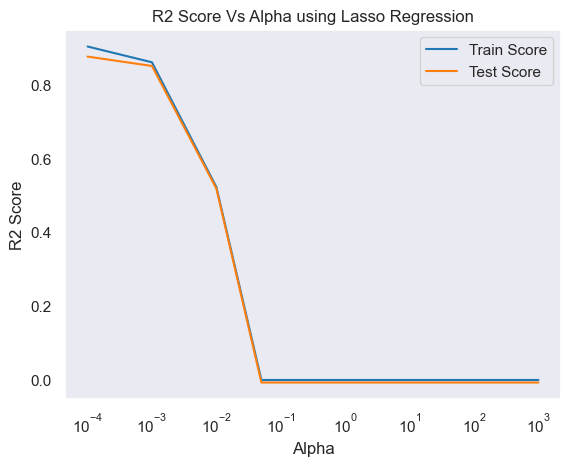

In [75]:
# plotting mean test and train scores with alpha 

# Converting the 'param_alpha' datatype from object to float
lasso_cv_results['param_alpha'] = lasso_cv_results['param_alpha'].astype('float32')

# Plotting R2 Score of Train score
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'])

# Plotting R2 Score of Test score
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'])

plt.xlabel('Alpha')
plt.ylabel('R2 Score')
plt.title("R2 Score Vs Alpha using Lasso Regression")
plt.legend(['Train Score', 'Test Score'], loc='upper right')
plt.xscale('log')
plt.show()

**<font color="maroon">Based on above data for Lasso Regression best Alpha Value is `"0.0001"` for processing.</font>**

### List of alphas to tune using Lasso Regression

In [76]:
# list of alphas to tune

params = {'alpha': [0.0001, 0.001, 0.01]}

lasso = Lasso()

# cross validation
folds = 5
lasso_model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
lasso_model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01]},
             return_train_score=True, scoring='r2', verbose=1)

## 4.15 Predict the best (Best param, Best Score & Best estimator) hyperparameter alpha using Lasso Regression

In [77]:
# Printing the best hyperparameter alpha
print("Lasso Best param: ", lasso_model_cv.best_params_)
print("Lasso Best Score: ", lasso_model_cv.best_score_)
print("Lasso Best estimator: ", lasso_model_cv.best_estimator_)
lasso_cv_results = pd.DataFrame(lasso_model_cv.cv_results_)
lasso_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']]

Lasso Best param:  {'alpha': 0.0001}
Lasso Best Score:  0.8758647753041681
Lasso Best estimator:  Lasso(alpha=0.0001)


,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,0.903165,0.875865,1
1,0.001,0.860416,0.850455,2
2,0.01,0.522432,0.518421,3


## 4.16 Plotting mean test and train set with alpha VS R2 scores using Lasso Regression

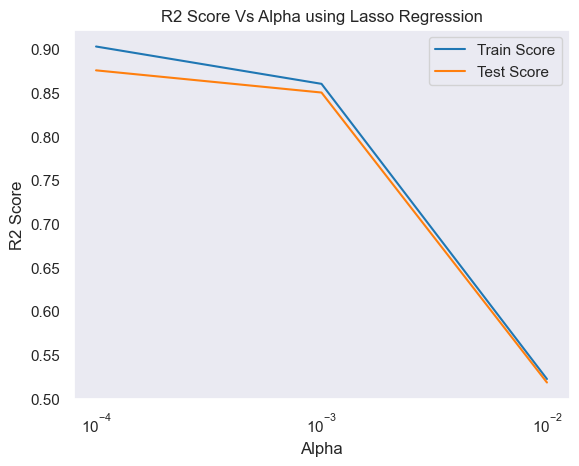

In [78]:
# plotting mean test and train scores with alpha 

# Converting the 'param_alpha' datatype from object to float
lasso_cv_results['param_alpha'] = lasso_cv_results['param_alpha'].astype('float32')

# Plotting R2 Score of Train score
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'])

# Plotting R2 Score of Test score
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'])

plt.xlabel('Alpha')
plt.ylabel('R2 Score')
plt.title("R2 Score Vs Alpha using Lasso Regression")
plt.legend(['Train Score', 'Test Score'], loc='upper right')
plt.xscale('log')
plt.show()

## 4.17 Fitting Lasso model for alpha = 0.0001 and printing coefficients which have been penalised

In [79]:
#Fitting lasso model for alpha = 0.0001 and printing coefficients which have been penalised
alpha = 0.0001
lasso = Lasso(alpha=alpha)

lasso.fit(X_train_new, y_train)
print(lasso.coef_)

[-0.03551438 -0.03667182  0.05457111  0.18499407  0.0733032  -0.
  0.04555436  0.02826039  0.020732    0.          0.02034488  0.32595751
  0.04875706  0.03606211  0.04133275  0.02247584  0.02735748  0.08410961
  0.02149395 -0.02836799  0.06513643  0.07039588  0.0767802   0.04487085
 -0.          0.01138844  0.03499727  0.04514389 -0.02101132 -0.01125468
  0.03476325  0.04247679  0.0368511   0.03538411  0.02322576 -0.01539424
 -0.          0.         -0.          0.         -0.0147152   0.03121626
 -0.          0.          0.         -0.01771574  0.00114032  0.
 -0.          0.          0.         -0.01917306  0.00719147  0.01504788
  0.02015502  0.02160334  0.00196705  0.          0.01391432  0.
  0.00411559  0.01546162  0.0245067 ]


## 4.18 Predict using Lasso Model Evaluation on train and test set with R2, RSS MSE and RMSE Score

In [80]:
y_train_pred = lasso.predict(X_train_new)
y_test_pred = lasso.predict(X_test_new)

print("****************Data after Lasso Regression********************")
metric3 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data after Lasso Regression********************
Train R2 score:  0.9003595954841752
Test R2 score:  0.8834629372893992
Train RSS score:  1.6915586684759965
Test RSS score:  0.8921785120245038
Train MSE score:  0.001656766570495589
Test MSE score:  0.0020322972939054757
Train RMSE score:  0.04070339753012749
Test RMSE score:  0.04508100812876167
***************************************************************


**<font color="blue">We have a good `train score` `89.88`% and good `test score` as well `88.20`%.  </font>**

## 4.19 Analysis Coefficient prediction of Top 10 feature of Lasso Regression

In [81]:
#Top 10 feature of Lasso Regression

lasso_param_df = pd.DataFrame({'Features':X_train_new.columns, 'Coeficient':lasso.coef_})
(lasso_param_df.sort_values('Coeficient', ascending=False)).head(10)

,Features,Coeficient
11,GrLivArea,0.325958
3,OverallQual,0.184994
17,GarageCars,0.084110
22,MSZoning_RL,0.076780
4,OverallCond,0.073303
21,MSZoning_RH,0.070396
20,MSZoning_FV,0.065136
2,LotArea,0.054571
12,BsmtFullBath,0.048757
6,BsmtQual,0.045554


## 4.20 Compare all metrics & all Regression together
##### Compare all metrics (R2, RSS MSE and RMSE Score) by creating a table which will contain all (Linear, Ridge & Lasso Regression) together


In [82]:
# Let's compare all metrics by creating a table which will contain all together

lr_table = {'Metrics': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)', 'MSE (Train)','MSE (Test)', 
                        'RMSE (Train)','RMSE (Test)'], 
            'Linear Regression': metric1
           }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metrics', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metrics,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.043473e-01,0.902507,0.900360
1,R2 Score (Test),-6.368140e+23,0.879736,0.883463
2,RSS (Train),1.623862e+00,1.655099,1.691559
3,RSS (Test),4.875288e+24,0.920714,0.892179
4,MSE (Train),1.590462e-03,0.001621,0.001657
5,MSE (Test),1.110544e+22,0.002097,0.002032
6,RMSE (Train),3.988060e-02,0.040262,0.040703
7,RMSE (Test),1.053824e+11,0.045796,0.045081


## 4.21 Observe the changes in the coefficients of all the Regression after regularization

In [83]:
betas = pd.DataFrame(index=X_train_new.columns)

In [84]:
betas.rows = X_train_new.columns

In [85]:
betas['Linear'] = hp_lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [86]:
pd.set_option('display.max_rows', None)
betas.head(50)

,Linear,Ridge,Lasso
MSSubClass,-4.329106e-02,-0.036299,-0.035514
LotFrontage,-9.209051e-02,-0.045823,-0.036672
LotArea,1.160183e-01,0.077082,0.054571
OverallQual,1.773307e-01,0.172172,0.184994
OverallCond,7.235902e-02,0.074240,0.073303
MasVnrArea,-1.227159e-02,-0.001360,-0.000000
BsmtQual,5.317945e-02,0.055860,0.045554
BsmtExposure,2.993173e-02,0.028551,0.028260
BsmtFinType1,2.676690e-02,0.019981,0.020732
BsmtFinSF1,-4.345672e-02,0.003224,0.000000



# <font color=green>Step 5: Residual Analysis:</font>

## 5.1 Residual analysis comparision between Error Distribution on Train Data and Test Data

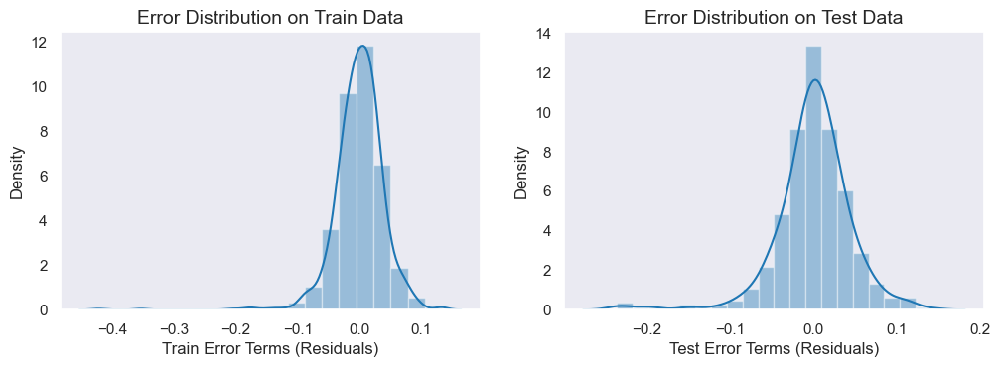

In [87]:
plt.figure(figsize=(12,8))

#Train Data Plot
plt.subplot(2,2,1)
residual_train = y_train - y_train_pred
sns.distplot(residual_train, bins=20)
plt.title("Error Distribution on Train Data", fontdict={'fontsize': 14})
plt.xlabel("Train Error Terms (Residuals)")

#Test Data Plot
plt.subplot(2,2,2)
residual_test = y_test - y_test_pred
sns.distplot(residual_test, bins=20)
plt.title("Error Distribution on Test Data", fontdict={'fontsize': 14})
plt.xlabel("Test Error Terms (Residuals)")

plt.show()

## 5.2 Residual analysis comparision between Residual Vs Predictive Values for Train Data and Test Data

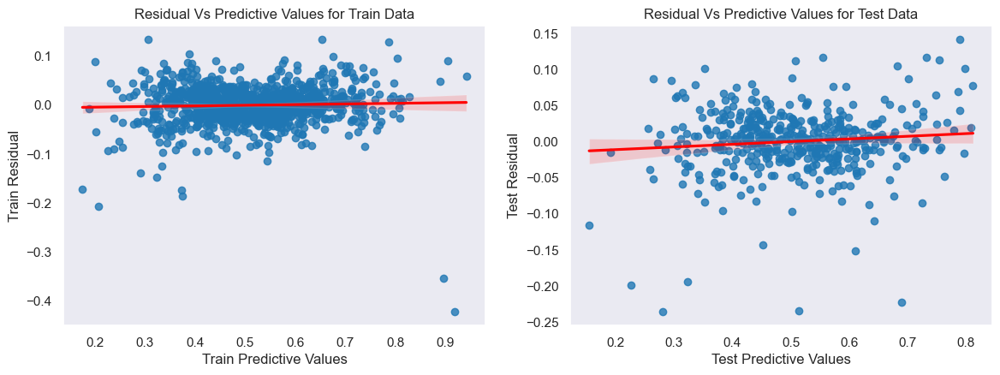

In [88]:
plt.figure(figsize=(14,10))
#Train Data
plt.subplot(2,2,1)
sns.regplot(x=y_train_pred,y=residual_train, line_kws={"color": "red"})
plt.title("Residual Vs Predictive Values for Train Data", fontdict={'fontsize':12})
plt.xlabel("Train Predictive Values")
plt.ylabel("Train Residual")

#Test Data
plt.subplot(2,2,2)
sns.regplot(x=y_test_pred,y=residual_test, line_kws={"color": "red"})
plt.title("Residual Vs Predictive Values for Test Data", fontdict={'fontsize':12})
plt.xlabel("Test Predictive Values")
plt.ylabel("Test Residual")
plt.show()

`There is no relation and specific pattern between residual and predicted values, henceforth its good model `

## 5.3 Residual analysis comparision between Actual Vs Predictive Train Values and Test Values

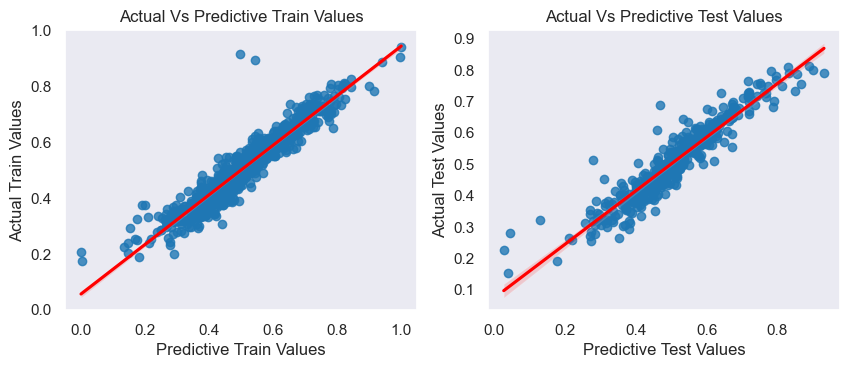

In [89]:
plt.figure(figsize=(10,8))

#Train Data
plt.subplot(2,2,1)
sns.regplot(x=y_train,y=y_train_pred, line_kws={"color": "red"})
plt.title("Actual Vs Predictive Train Values", fontdict={'fontsize':12})
plt.xlabel("Predictive Train Values")
plt.ylabel("Actual Train Values")

#Test Data
plt.subplot(2,2,2)
sns.regplot(x=y_test,y=y_test_pred, line_kws={"color": "red"})
plt.title("Actual Vs Predictive Test Values", fontdict={'fontsize':12})
plt.xlabel("Predictive Test Values")
plt.ylabel("Actual Test Values")

plt.show()

## <font color="green">Steo 6: Conclusion:</font>

- The residual analysis for both test and train data seem to fit the assumptions of the Linear Regression.
- Residuals have mean of zero and closely normally distributed.
- Residuals do not have any pattern hence it has homoscedasticity.


Below are the TOP 10 variables which are significant in predicting the Sale Price.
- **GrLivArea:** Above grade (ground) living area square feet.
- **OverallQual:** Rates the overall material and finish of the house.
- **MSZoning_RL:** Identifies residential with Low Density zone. 
- **MSZoning_RH:** Identifies residential with High Density zone. 
- **OverallCond:** Rates the overall condition of the house.
- **GarageCars:** Size of garage in car capacity.
- **LotArea:** Lot size in square feet
- **BedroomAbvGr:** Bedrooms above grade (does NOT include basement bedrooms)
- **MSZoning_RM:** Identifies residential with Medium Density zone.
- **MSZoning_FV:** Identifies residential with Floating Village Residential

**Ridge Regression**
   - R2 score(Train): 90.05%
   - R2 score(Test): 87.86%
        
**Lasso Regression**
   - R2 score(Train): 89.88%
   - R2 score(Test): 88.20%

Optimal value of alpha for Ridge and Lasso Regression is below:

- **Alpha value for Ridge Regression:** <font color="blue">1</font>
        
- **Alpha value for Lasso Regression:** <font color="blue">0.0001</font>

===============================================================================

- Though the model performance by Ridge Regression was better in terms of R2 values of Train and Test, it is better to use Lasso, since it brings and assigns a zero value to insignificant features, enabling us to choose the predictive variables.
  
- It is always advisable to use simple yet robust model.

- Equation can be formulated using the features and coefficients obtained by Lasso.

******************************************************************************************************************
 # <font color=green>End of Problem Statement - Part I of the Assignment</font>
 

******************************************************************************************************************

# <font color = blue>Problem Statement - Part II  <font> <font color = green>Subjective Questions Assignment<font>

### **<font color=red>Question 1) </font>**

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

### **<font color=green>Answer 1:</font>** 


Optimal value of alpha for Ridge and Lasso Regression is below:

- **Alpha value for Ridge Regression:** <font color="blue">1</font>
        
- **Alpha value for Lasso Regression:** <font color="blue">0.0001</font>

### Fitting Ridge model for alpha = 2 and printing coefficients which have been penalised

In [90]:
#Fitting Ridge model for alpha = 2 and printing coefficients which have been penalised
alpha_2 = 2
ridge_2 = Ridge(alpha=alpha_2)

ridge_2.fit(X_train_new, y_train)

Ridge(alpha=2)

### Data after Ridge Regression Alpha Value on train and test set with R2, RSS MSE and RMSE Score

In [91]:
y_train_pred = ridge_2.predict(X_train_new)
y_test_pred = ridge_2.predict(X_test_new)

print("****************Data after Ridge Regression Alpha Value = 2********************")
metric2 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data after Ridge Regression Alpha Value = 2********************
Train R2 score:  0.8989561252912049
Test R2 score:  0.8772650813098052
Train RSS score:  1.7153848681226425
Test RSS score:  0.93962774231228
Train MSE score:  0.0016801027111877007
Test MSE score:  0.0021403821009391344
Train RMSE score:  0.040989055992883036
Test RMSE score:  0.04626426375658792
***************************************************************


**<font color="black">Train R2 score reduces little bit from 90.05%  to `89.70`% and Test R2 score also reduce from 87.86% to `87.11`%.</font>**

### Top 10 feature of Ridge Regression

In [92]:
#Top 10 feature of Ridge Regression

ridge_param_df_2 = pd.DataFrame({'Features':X_train_new.columns, 'Coeficient_2':ridge_2.coef_})
(ridge_param_df_2.sort_values('Coeficient_2', ascending=False)).head(10)

,Features,Coeficient_2
11,GrLivArea,0.226256
3,OverallQual,0.166509
17,GarageCars,0.084480
14,BedroomAbvGr,0.071474
4,OverallCond,0.071457
22,MSZoning_RL,0.067890
21,MSZoning_RH,0.063652
2,LotArea,0.060995
20,MSZoning_FV,0.055677
13,FullBath,0.054135


###  Increasing Alpha value of Lasso Regression from 0.0001 to 0.0002

In [93]:
####  Increasing Alpha value of Lasso Regression from 0.0001 to 0.0002 
alpha_0002 = 0.0002
lasso_0002 = Lasso(alpha=alpha_0002)

lasso_0002.fit(X_train_new, y_train)

Lasso(alpha=0.0002)

### Data after Lasso Regression with Value = 0.0002 on train and test set with R2, RSS MSE and RMSE Score

In [94]:
y_train_pred = lasso_0002.predict(X_train_new)
y_test_pred = lasso_0002.predict(X_test_new)

print("****************Data after Lasso Regression with Value = 0.0002********************")
metric5 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data after Lasso Regression with Value = 0.0002********************
Train R2 score:  0.8931850087131114
Test R2 score:  0.8788429233825852
Train RSS score:  1.8133590014262602
Test RSS score:  0.9275481792963631
Train MSE score:  0.001776061705608482
Test MSE score:  0.0021128660120646086
Train RMSE score:  0.042143347109697894
Test RMSE score:  0.04596592229102565
***************************************************************


**<font color="black">Train R2 score reduces little bit from 89.88%  to `89.05`% and Test R2 score also reduce from 88.20% to `87.65`%.</font>**

### Top 10 feature of Lasso Regression

In [95]:
#Top 10 feature of Lasso Regression

lasso_param_df_0002 = pd.DataFrame({'Features':X_train_new.columns, 'Coeficient_0002':lasso_0002.coef_})
(lasso_param_df_0002.sort_values('Coeficient_0002', ascending=False)).head(10)

,Features,Coeficient_0002
11,GrLivArea,0.313462
3,OverallQual,0.193191
17,GarageCars,0.085056
4,OverallCond,0.068935
12,BsmtFullBath,0.048491
27,Neighborhood_Crawfor,0.039828
13,FullBath,0.038438
31,Neighborhood_NridgHt,0.036360
22,MSZoning_RL,0.034651
6,BsmtQual,0.034409


In [96]:
mt_table_2 = {'Metrics': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)', 'MSE (Train)','MSE (Test)', 
                          'RMSE (Train)','RMSE (Test)'], 
              'Ridge Regression_1': metric2, 
              'Lasso Regression_0.0001': metric3, 
              'Ridge Regression_2': metric2, 
              'Lasso Regression_0.0002': metric5, 
            }

final_metric_2 = pd.DataFrame(mt_table_2 ,columns = ['Metrics', 'Ridge Regression_1', 'Lasso Regression_0.0001', 'Ridge Regression_2', 'Lasso Regression_0.0002'] )

final_metric_2

,Metrics,Ridge Regression_1,Lasso Regression_0.0001,Ridge Regression_2,Lasso Regression_0.0002
0,R2 Score (Train),0.898956,0.900360,0.898956,0.893185
1,R2 Score (Test),0.877265,0.883463,0.877265,0.878843
2,RSS (Train),1.715385,1.691559,1.715385,1.813359
3,RSS (Test),0.939628,0.892179,0.939628,0.927548
4,MSE (Train),0.001680,0.001657,0.001680,0.001776
5,MSE (Test),0.002140,0.002032,0.002140,0.002113
6,RMSE (Train),0.040989,0.040703,0.040989,0.042143
7,RMSE (Test),0.046264,0.045081,0.046264,0.045966


`There is minor reduction in both train and test R2 when we double value of alpha`

### Observe the changes in the co-efficient after the regularization

In [97]:
#Lets observe the changes in the co-efficient after the regularization
betas_2 = pd.DataFrame(index=X_train_new.columns)

In [98]:
betas_2.rows = X_train_new.columns

In [99]:
betas_2['Ridge_2'] = ridge_2.coef_
betas_2['Lasso_0002'] = lasso_0002.coef_

In [100]:
pd.set_option('display.max_rows', None)
betas_2.head(50)

,Ridge_2,Lasso_0002
MSSubClass,-0.032602,-0.030647
LotFrontage,-0.025790,-0.000000
LotArea,0.060995,0.003232
OverallQual,0.166509,0.193191
OverallCond,0.071457,0.068935
MasVnrArea,0.006477,0.000000
BsmtQual,0.053828,0.034409
BsmtExposure,0.028316,0.027668
BsmtFinType1,0.018789,0.020966
BsmtFinSF1,0.012316,0.000000


### Below are the TOP 10 variables which are significant in predicting the Sale Price after doubling ALPHA values.

- **GrLivArea:** Above grade (ground) living area square feet.
- **OverallQual:** Rates the overall material and finish of the house.
- **GarageCars:** Size of garage in car capacity.
- **OverallCond:** Rates the overall condition of the house.
- **FullBath:** Full bathrooms above grade
- **BedroomAbvGr:** Bedrooms above grade (does NOT include basement bedrooms)
- **MSZoning_RL:** Identifies residential with Low Density zone. 
- **Neighborhood_NridgHt:** hysical locations within Ames city limits Northridge Heights
- **BsmtFullBath:** Basement full bathrooms
- **Neighborhood_Crawfor:** Physical locations within Ames city limits is Crawford.


### **<font color=red>Question 2)</font>**
**<font color=red>You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?</font>**

### **<font color=green>Answer 2:</font>** 

The choice between Ridge and Lasso regression hinges on the specific context and modeling goals. If interpretability is paramount or feature selection is desired, Lasso regression with the determined optimal alpha might be preferable. However, if maintaining all features' influence while mitigating multicollinearity is crucial, Ridge regression with the determined optimal lambda is a better fit. Both techniques have their strengths: Ridge is robust against multicollinearity, while Lasso performs feature selection. Hence, the choice should align with the priorities: interpretability and feature selection (Lasso) or multicollinearity control (Ridge), determined by the dataset's characteristics and modeling objectives.

##### **<font color=green>As per our House Price Data set prediction, the R2 Score of Lasso is better than Ridge for Test Data, so we will prefer to go for Lasso regression.</font>** 
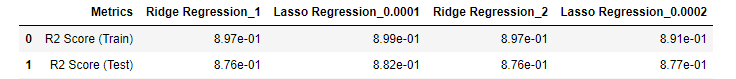



### **<font color=red>Question 3)</font>** 
**<font color=red>After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?</font>**


### **<font color=green>Answer 3:</font>** 



If the five most important predictor variables from the Lasso model are not available in the incoming data, the next five most important predictors should be identified to build a new model. Rebuilding the model without those unavailable variables necessitates reassessing feature importance. By rerunning the Lasso model on the available dataset and excluding the previously identified five variables, the new five most important predictors would emerge based on their non-zero coefficients. These newly identified predictors would hold significance in the updated model, contributing the most to the model's predictive capability in the absence of the previously unavailable variables.

##### **<font color=green>As per our House Price Data set prediction, Below are the TOP 5 variables which are significant in predicting the Sale Price.</font>** 

- **GrLivArea:** Above grade (ground) living area square feet.
- **OverallQual:** Rates the overall material and finish of the house.
- **GarageCars:** Size of garage in car capacity.
- **OverallCond:** Rates the overall condition of the house.
- **BsmtFullBath:** Basement full bathrooms

So let's remove those and again build model using Lasso Regression.

In [101]:
#drop Top 5 column list 
drop_top5 = ['GrLivArea', 'OverallQual', 'GarageCars', 'OverallCond', 'BsmtFullBath']

In [102]:
#Display the previous list of columns
print("************Train Data Columns**************")
print(X_train_new.columns)
print("\n************Test Data Columns**************")
print(X_test_new.columns)

print("\nShape of Train Data Set: ", X_train_new.shape)
print("\nShape of Test Data Set: ", X_test_new.shape)

************Train Data Columns**************
Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'HeatingQC', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'BedroomAbvGr',
       'KitchenQual', 'FireplaceQu', 'GarageCars', 'WoodDeckSF', 'HouseOld',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'LotConfig_FR3', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_MeadowV',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst',
       'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'BldgType_Twnhs',
       'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'RoofStyle_Gambrel',
       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace',
       'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc',
       'Exterior1st_Stucco', 'Exterior1st_WdShing', 'E

In [103]:
#Let's drop "drop_top5" from X_train_new.columns and X_test_new.columns
X_train_new_2 = X_train_new.drop(drop_top5, axis=1)
X_test_new_2 = X_test_new.drop(drop_top5, axis=1)

print("\nShape of Train Data Set after removing columns: ", X_train_new_2.shape)
print("\nShape of Test Data Set after removing columns: ", X_test_new_2.shape)


Shape of Train Data Set after removing columns:  (1021, 58)

Shape of Test Data Set after removing columns:  (439, 58)


## Build lasso regression after dropping top 5 vairables from previous model

In [104]:
#Fitting lasso model for alpha = 0.0001 after droping the variable and fetching coefocoent which have beeen penalised
alpha_drop = 0.0001
lasso_drop = Lasso(alpha=alpha_drop)

lasso_drop.fit(X_train_new_2, y_train)

Lasso(alpha=0.0001)

In [105]:
y_train_pred = lasso_drop.predict(X_train_new_2)
y_test_pred = lasso_drop.predict(X_test_new_2)

print("****************Data after Lasso Regression with Value = 0.0001 after removal top 5 variables********************")
metric6 = calculate_metric(y_train, y_train_pred, y_test, y_test_pred)
print("***************************************************************")

****************Data after Lasso Regression with Value = 0.0001 after removal top 5 variables********************
Train R2 score:  0.8410629326393748
Test R2 score:  0.806159065103725
Train RSS score:  2.698216404704783
Test RSS score:  1.4839975613137335
Train MSE score:  0.0026427192994170254
Test MSE score:  0.0033804044676850422
Train RMSE score:  0.051407385650478525
Test RMSE score:  0.05814124583877647
***************************************************************


**<font color="black">`Train R2 score reduces` drastically bit from `89.88%`  to `84.20%` and `Test R2 score also reduces` from `88.20%` to `80.22%` after removal of Top 5 predictive variables.</font>**

In [106]:
#Top 10 feature of Lasso Regression

lasso_param_df_drop = pd.DataFrame({'Features':X_train_new_2.columns, 'Coeficient_drop':lasso_drop.coef_})
(lasso_param_df_drop.sort_values('Coeficient_drop', ascending=False)).head(10)

,Features,Coeficient_drop
10,BedroomAbvGr,0.167528
2,LotArea,0.146052
7,BsmtFinSF1,0.106495
9,FullBath,0.106131
4,BsmtQual,0.098540
17,MSZoning_RL,0.096631
11,KitchenQual,0.089303
16,MSZoning_RH,0.086653
15,MSZoning_FV,0.084388
25,Neighborhood_NoRidge,0.082088


In [107]:

mt_table_3 = {'Metrics': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)', 'MSE (Train)','MSE (Test)', 
                          'RMSE (Train)','RMSE (Test)'], 
              'Lasso Regression_0.0001': metric3, 
              'Lasso Regression_drop_0.0001': metric6, 
             }

final_metric_3 = pd.DataFrame(mt_table_3 ,columns = ['Metrics', 'Lasso Regression_0.0001', 'Lasso Regression_drop_0.0001'] )

final_metric_3

,Metrics,Lasso Regression_0.0001,Lasso Regression_drop_0.0001
0,R2 Score (Train),0.900360,0.841063
1,R2 Score (Test),0.883463,0.806159
2,RSS (Train),1.691559,2.698216
3,RSS (Test),0.892179,1.483998
4,MSE (Train),0.001657,0.002643
5,MSE (Test),0.002032,0.003380
6,RMSE (Train),0.040703,0.051407
7,RMSE (Test),0.045081,0.058141


`Both Train and Test R2 score drastically decreases in Lasso Regression, after we remove top 5 redictive variables`

**Below are the TOP 5 variables which are significant in predicting the Sale Price after removing 5 predictive variables from previous model..**

 
- **BedroomAbvGr:** Bedrooms above grade (does NOT include basement bedrooms)
- **LotArea:** Lot size in square feet
- **MSZoning_RL:** Identifies residential with Low Density zone. 
- **FullBath:** Full bathrooms above grade
- **BsmtFinSF1:** Type 1 finished square feet
 
 

### **<font color=red>Question 4)</font>**

**<font color=red>How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?</font>**

### **<font color=green>Answer 4:</font>** 

Below are the pointers I learn from the course module lecture and note down as key point.

- Robust refers the model works for a broad range of inputs. If the model gets really good results at training time (it seems “more accurate”) but won’t generalize to out-of-sample data (i.e. it isn’t robust) then we call it overfitting. 

- The model should be generalized so that the test accuracy is not lesser than the training score.

- Here in our case, based on all data and modelling both Ridge and Lasso performed good on Train and Test Data which shows our model with Alpah value "1" for Ridge and "0.0001" for Lasso is Robust and more Generalized model.

    - Simpler models are more generic
    - Simpler model requires fewer training samples
    - Simpler model are more robust

- Too much importance should not given to the outliers so that the accuracy predicted by the model is high. But outliers analysis needs to be done and only those which are relevant to the dataset need to be retained and rest should be dropped.

**If the accuracy of the Train and Test are same then that means model is overfitted and it learnt all the Train and Test data and model is not robust and generalized. So, it will drastically be failed and will not work on broad range of unseen data.**



******************************************************************************************************************
 # <font color=green>End of Problem Statement - Part II of the Assignment</font>
 

******************************************************************************************************************